In [1]:
using LinearAlgebra
using Distributions
using StatsPlots
default(fmt=:png)
using Random

function sim(x, β, dist, d; L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    ginvA = (A'A)\A'
    utmp = [zeros(n) for _ in 1:Threads.nthreads()]
    y = [zeros(n) for _ in 1:Threads.nthreads()]
    b = [zeros(r) for _ in 1:Threads.nthreads()]
    β̂ = zeros(r, L)
    Threads.@threads for i in 1:L
        tid = Threads.threadid()
        u = rand!(dist, utmp[tid])
        @. y[tid] = y0 + u
        mul!(b[tid], ginvA, y[tid])
        β̂[:, i] .= b[tid]
    end
    β̂
end

rd(x; sigdigits=4) = round(x; sigdigits)

function plot_sim(x, β, dist, d; L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    
    β̂ = sim(x, β, dist, d; L)
    
    PP = []
    
    @show dist mean(dist) std(dist)
    println()
    P = plot(dist; label="residual dist.")
    push!(PP, P)
    
    u = rand(dist, n)
    y = y0 + u
    P = scatter(x, y; label="example of data", msc=:auto, ms=3)
    plot!(f, extrema(x)...; label="f(x)", ls=:dash)
    push!(PP, P)
    
    @show β
    @show meanβ̂ = rd.(vec(mean(β̂; dims=2)))
    @show rd.(std(dist) * .√diag(inv(A'A)))
    @show stdβ̂ = rd.(vec(std(β̂; dims=2)))
    println()
    
    for i in 1:r
        P = stephist(β̂[i, :]; norm=true, label="betahat[$(i)]")
        plot!(Normal(meanβ̂[i], stdβ̂[i]); label="normal approx.", ls=:dash)
        push!(PP, P)
    end

    @show n d
    
    h = 1 + (r+1) ÷ 2
    plot(PP...; size=(800, 250h), layout=(h, 2))
end

expeczero(dist) = dist - mean(dist)
standardized(dist) = (dist - mean(dist)) / std(dist)

standardized (generic function with 1 method)

In [2]:
ECDF(A, x) = count(≤(x), A)/length(A)

function sim_pval(x, β, dist, d; β₀ = β, L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    ginvA = (A'A)\A'
    sqrtdiaginvAA = .√diag(inv(A'A))
    nth = Threads.nthreads()
    utmp = [zeros(n) for _ in 1:nth]
    y = [zeros(n) for _ in 1:nth]
    b = [zeros(r) for _ in 1:nth]
    β̂ = zeros(r, L)
    uhat = [zeros(n) for _ in 1:nth]
    SEhat = zeros(r, L)
    T = zeros(r, L)
    pval = zeros(r, L)
    #Threads.@threads 
    for i in 1:L
        tid = Threads.threadid()
        u = rand!(dist, utmp[tid])
        @. y[tid] = y0 + u
        mul!(b[tid], ginvA, y[tid])
        @. β̂[:, i] = b[tid]
        @. uhat[tid] = y[tid] - evalpoly(x, (b[tid],))
        shat = √(dot(uhat[tid], uhat[tid])/(n - r))
        @. SEhat[:, i] = shat * sqrtdiaginvAA
        @. T[:, i] = (b[tid] - β₀) / @view(SEhat[:, i])
        @. pval[:, i] = 2ccdf(TDist(n-r), abs(@view(T[:, i])))
    end
    β̂, SEhat, T, pval
end

function plot_sim_pval(x, β, dist, d; β₀ = β, α = 0.05, L=10^6)
    f(x) = evalpoly(x, β)
    n, r = length(x), d+1
    y0 = f.(x)
    A = x .^ (0:d)'
    
    β̂, SEhat, T, pval = sim_pval(x, β, dist, d; β₀, L)
    
    PP = []
    
    @show dist mean(dist) std(dist)
    println()
    P = plot(dist; label="residual dist.")
    push!(PP, P)
    
    u = rand(dist, n)
    y = y0 + u
    P = scatter(x, y; label="example of data", msc=:auto, ms=3)
    plot!(f, extrema(x)...; label="f(x)", ls=:dash)
    push!(PP, P)
    
    @show β
    @show meanβ̂ = rd.(vec(mean(β̂; dims=2)))
    @show rd.(std(dist) * .√diag(inv(A'A)))
    @show stdβ̂ = rd.(vec(std(β̂; dims=2)))
    println()
    
    αs = exp.(range(log(0.002), log(1), 400))
    _tick = Any[0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1]
    xtick = ytick = (_tick, string.(_tick))
    
    @show n d
    @show β β₀
    @show α
    for i in 1:r
        @show ECDF(pval[i, :], α)
        P = plot(αs, α -> ECDF(pval[i, :], α); label="betahat[$i]")
        plot!(αs, identity; label="", ls=:dash)
        plot!(; xscale=:log10, yscale=:log10, xtick, ytick, xrotation=90)
        plot!(xguide="α", yguide="P(P-value ≤ α)")
        push!(PP, P)
    end
    
    h = 1 + (r+1) ÷ 2
    plot(PP...; size=(640, 320h), layout=(h, 2))
    plot!(leftmargin=4Plots.mm)
    plot!(tickfontsize=6)
end

plot_sim_pval (generic function with 1 method)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0001331, 1.001, 6.15e-5, -0.2003]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2393, 0.3215, 0.1102, 0.1025]

n = 10
d = 3


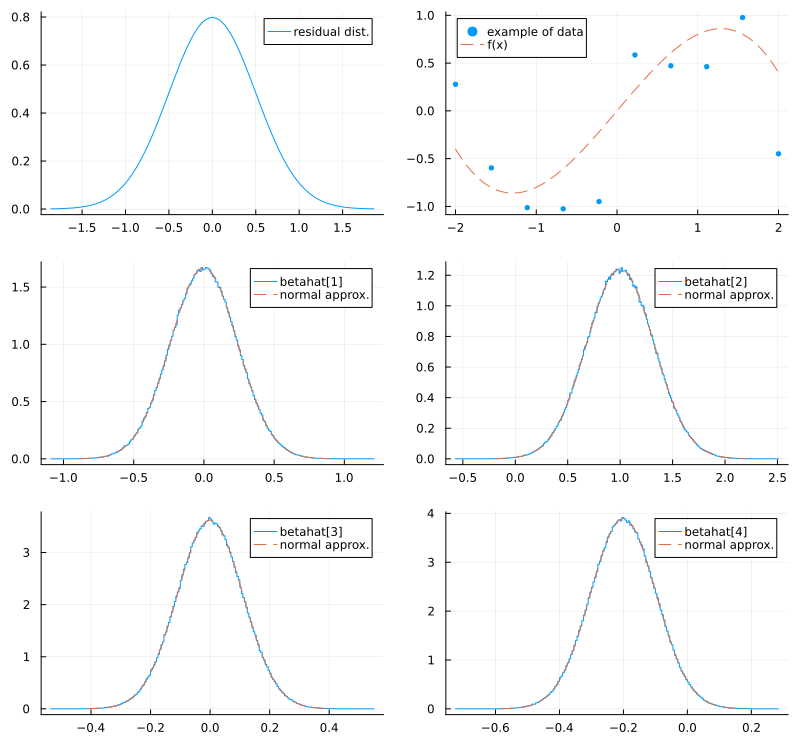

In [3]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0005747, 1.0, -0.0001677, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2391, 0.3216, 0.1101, 0.1026]

n = 10
d = 3


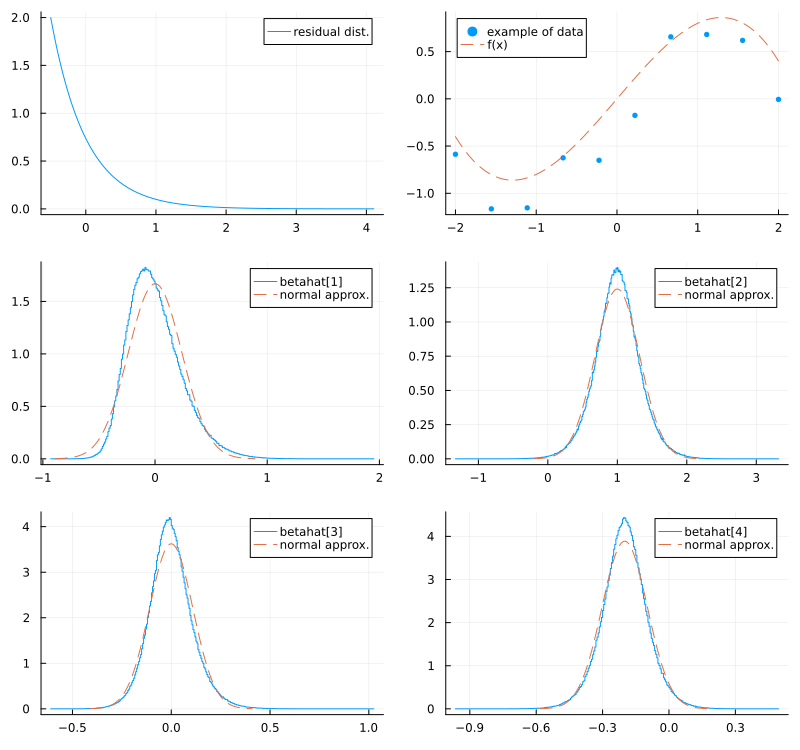

In [4]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0001702, 0.9998, -0.0001306, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1682, 0.2323, 0.08524, 0.08061]

n = 20
d = 3


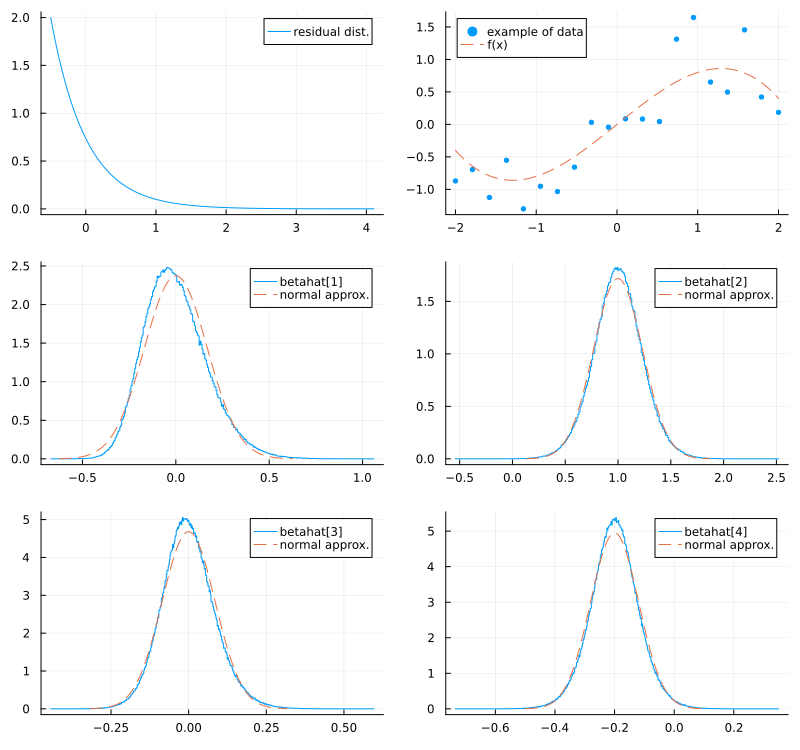

In [5]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0001204, 0.9998, -6.865e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1186, 0.1672, 0.06306, 0.06086]

n = 40
d = 3


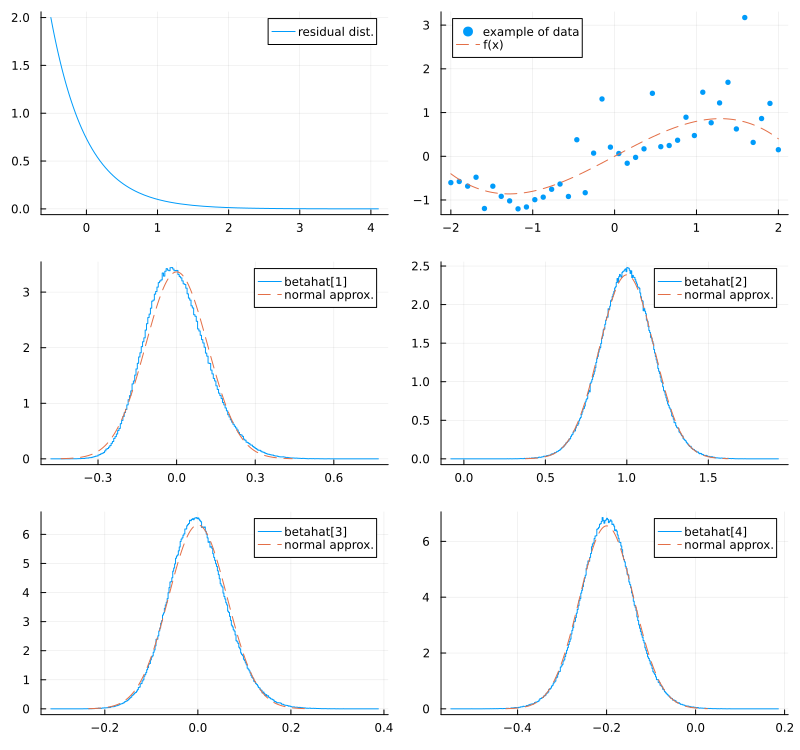

In [6]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0002369, 0.9999, 3.872e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2385, 0.3215, 0.1102, 0.1025]

n = 10
d = 3


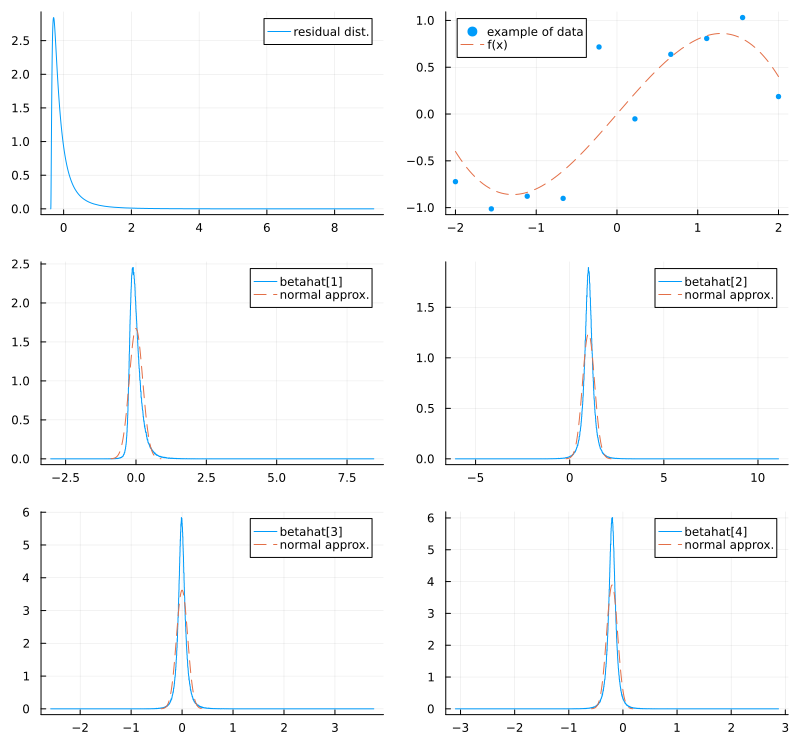

In [7]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.00018, 0.9999, -5.603e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1678, 0.232, 0.0849, 0.08044]

n = 20
d = 3


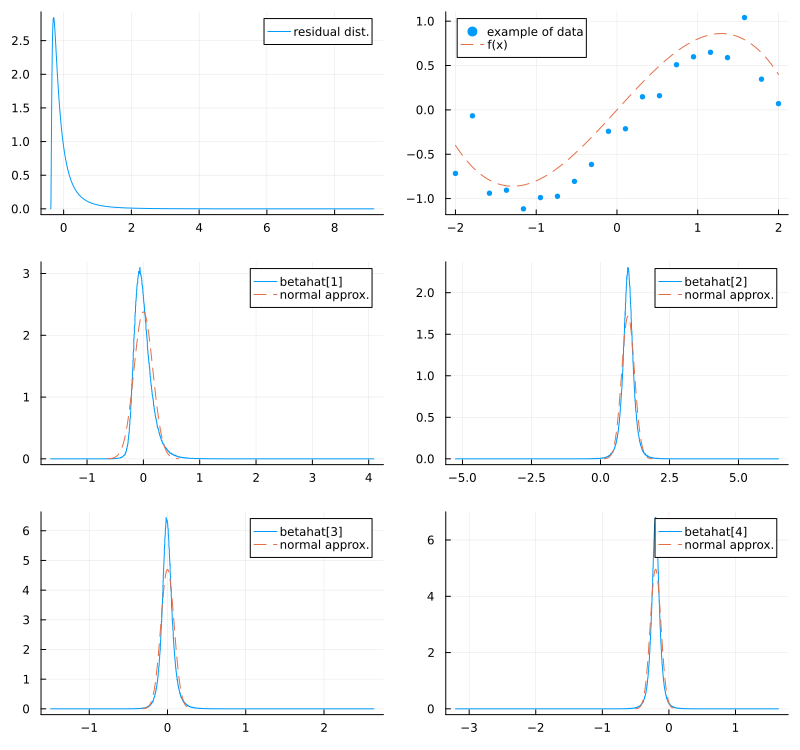

In [8]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-2.106e-6, 1.0, -8.202e-6, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1187, 0.1673, 0.06317, 0.06087]

n = 40
d = 3


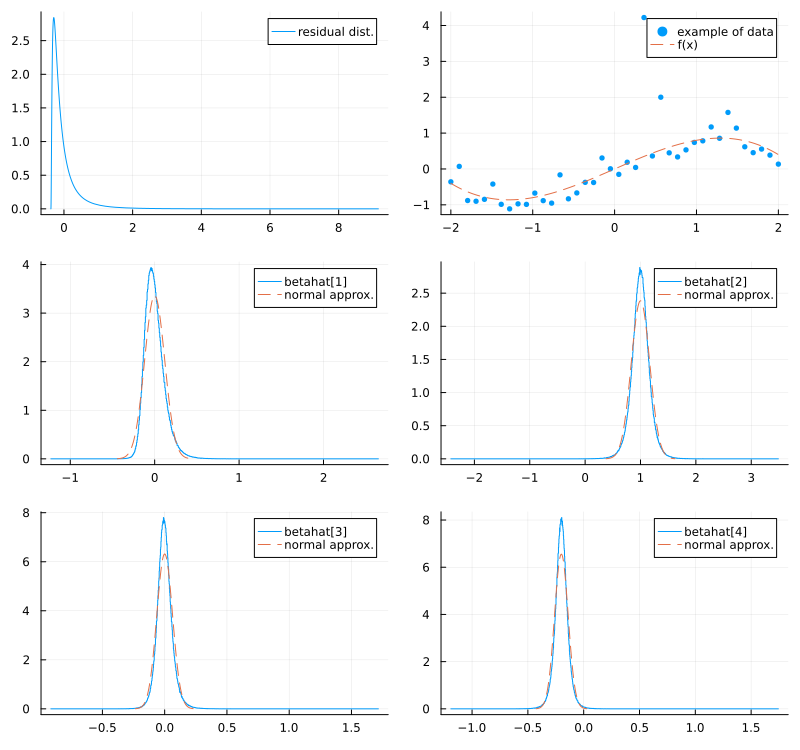

In [9]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [9.363e-5, 1.0, -5.14e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08381, 0.1198, 0.04569, 0.0446]

n = 80
d = 3


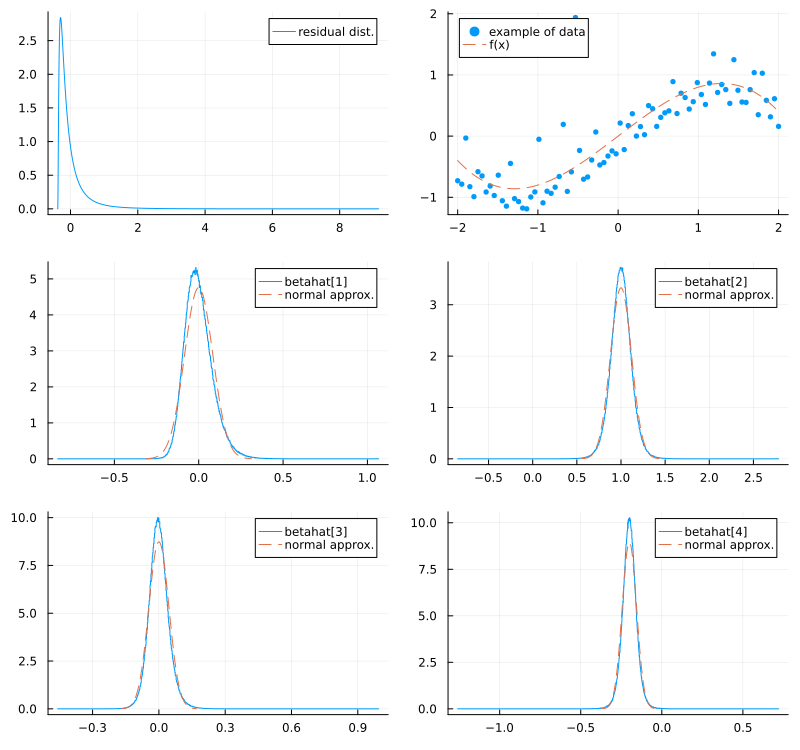

In [10]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-6.302e-6, 1.0, 3.792e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.05929, 0.08506, 0.03274, 0.03208]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.05926, 0.08507, 0.03273, 0.03207]

n = 160
d = 3


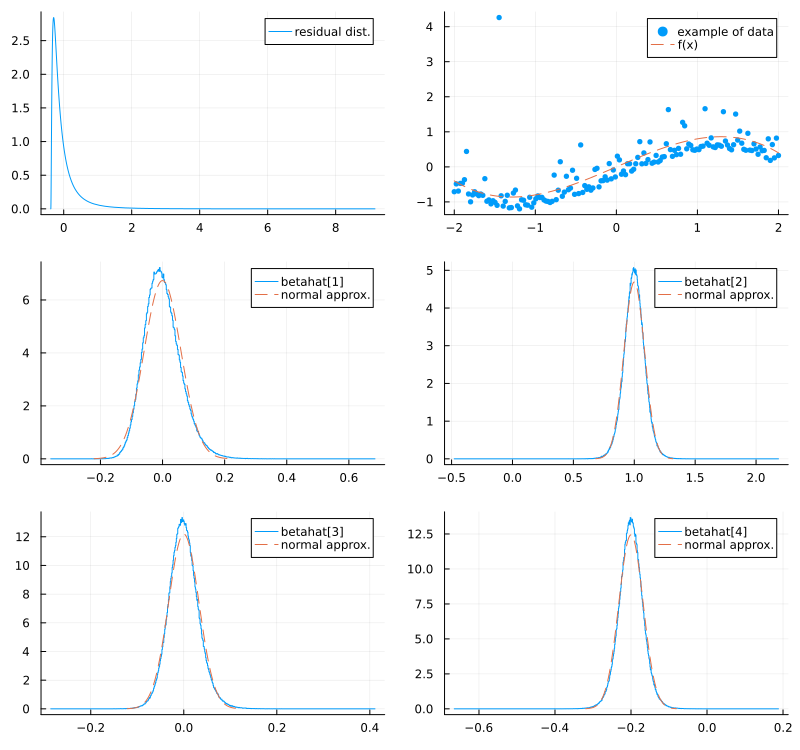

In [11]:
x = range(-2, 2, 160)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-8.88e-6, 1.0, -9.907e-6, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.04193, 0.06033, 0.02329, 0.0229]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.04193, 0.06027, 0.02327, 0.02288]

n = 320
d = 3


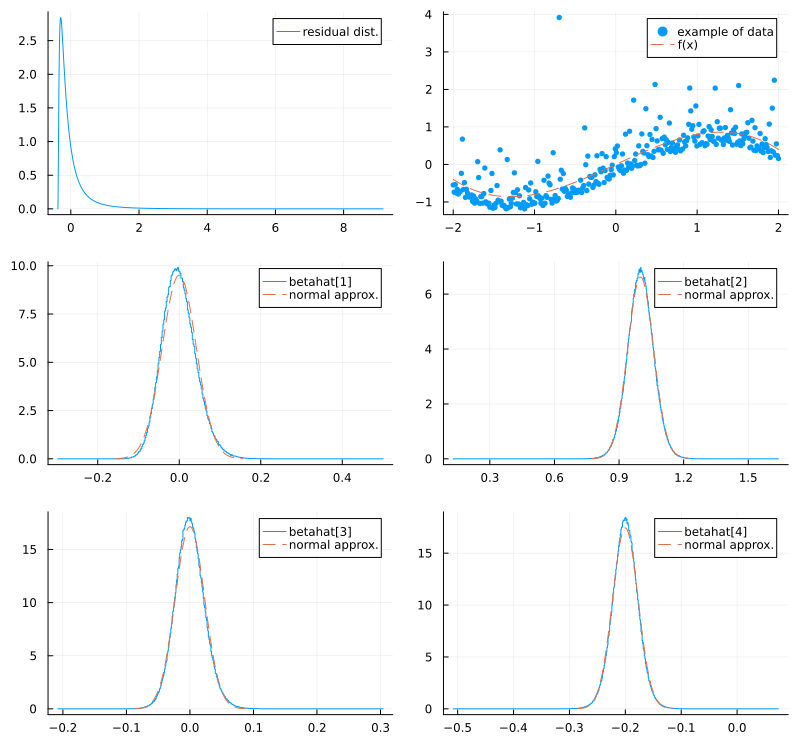

In [12]:
x = range(-2, 2, 320)
β = [0, 1, 0, -0.2]
dist = 0.5standardized(LogNormal())
d = 3
plot_sim(x, β, dist, d)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-1.816e-5, 1.0, 0.0001087, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2391, 0.3215, 0.1102, 0.1026]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.049844
ECDF(pval[i, :], α) = 0.050122
ECDF(pval[i, :], α) = 0.049887
ECDF(pval[i, :], α) = 0.050335


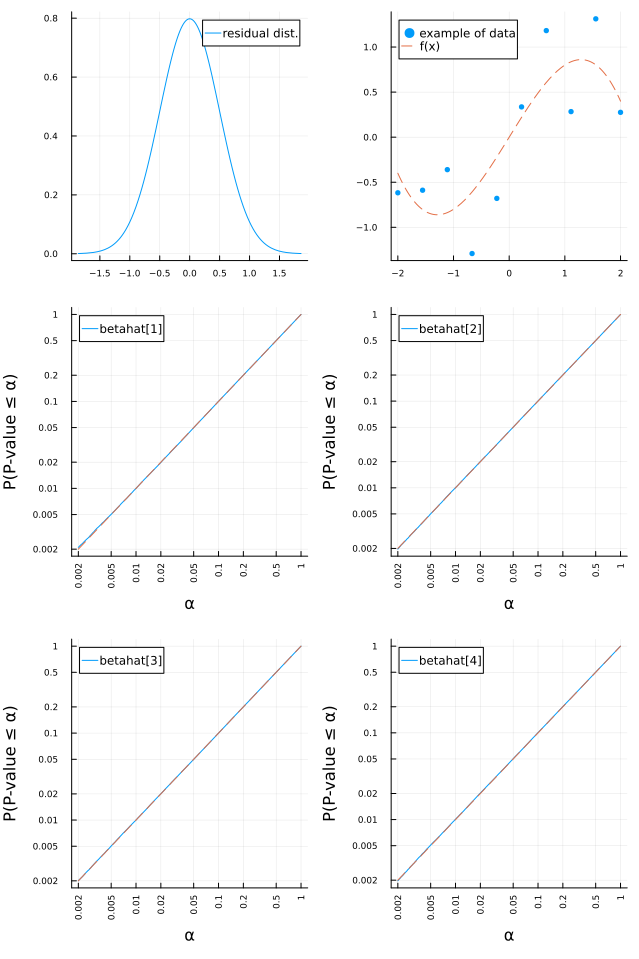

In [13]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = Normal{Float64}(μ=0.0, σ=0.5)
mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [4.956e-6, 0.9999, 4.292e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2391, 0.3213, 0.1102, 0.1024]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.049918
ECDF(pval[i, :], α) = 0.737148
ECDF(pval[i, :], α) = 0.049986
ECDF(pval[i, :], α) = 0.375608


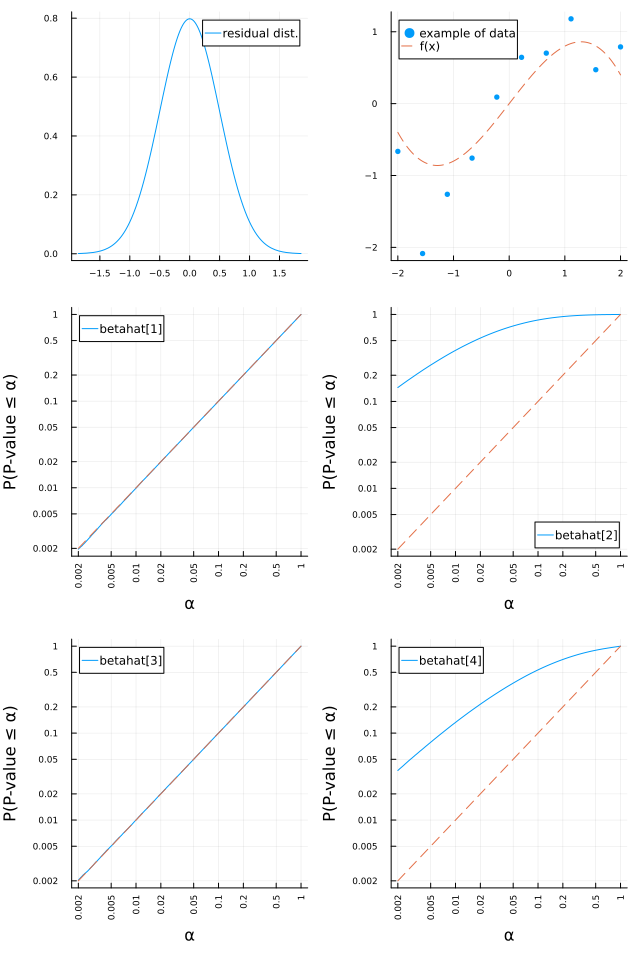

In [14]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = Normal(0, 0.5)
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [3.879e-5, 0.9998, 0.0001715, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.239, 0.3217, 0.1102, 0.1026]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.083969
ECDF(pval[i, :], α) = 0.042015
ECDF(pval[i, :], α) = 0.058608
ECDF(pval[i, :], α) = 0.053108


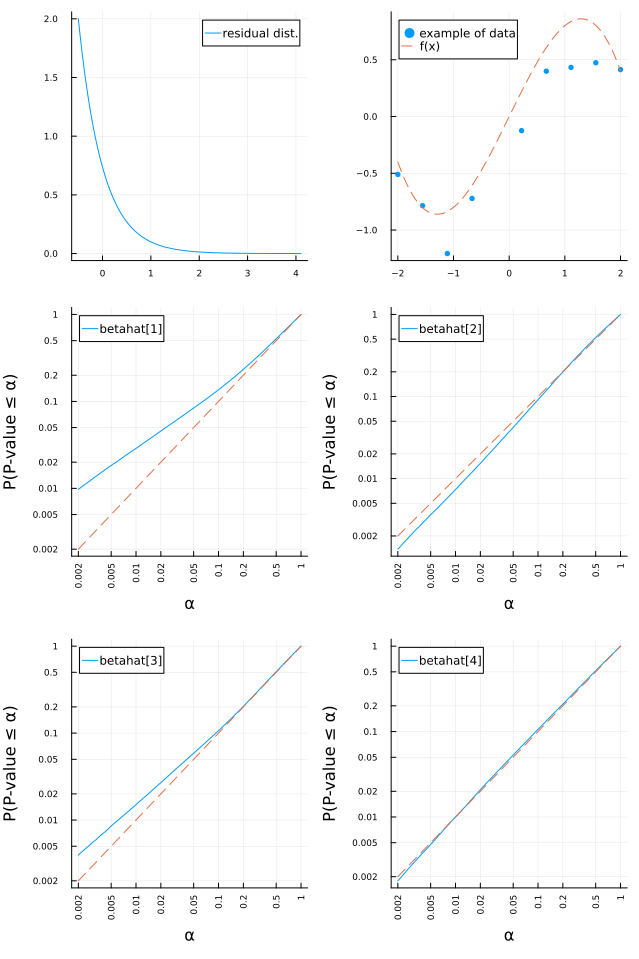

In [15]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0002472, 1.0, 8.476e-5, -0.2001]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.2392, 0.3214, 0.1102, 0.1025]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.2396, 0.3213, 0.1102, 0.1025]

n = 10
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.084434
ECDF(pval[i, :], α) = 0.775196
ECDF(pval[i, :], α) = 0.059042
ECDF(pval[i, :], α) = 0.475544


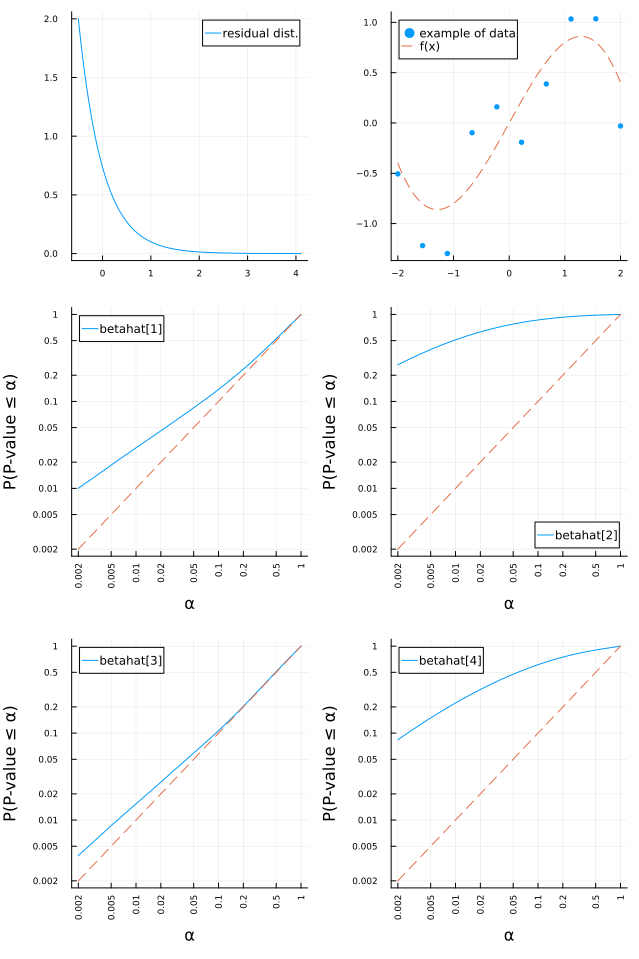

In [16]:
x = range(-2, 2, 10)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001532, 0.9998, 6.938e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1681, 0.2323, 0.08527, 0.08073]

n = 20
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.068252
ECDF(pval[i, :], α) = 0.045776
ECDF(pval[i, :], α) = 0.050324
ECDF(pval[i, :], α) = 0.051759


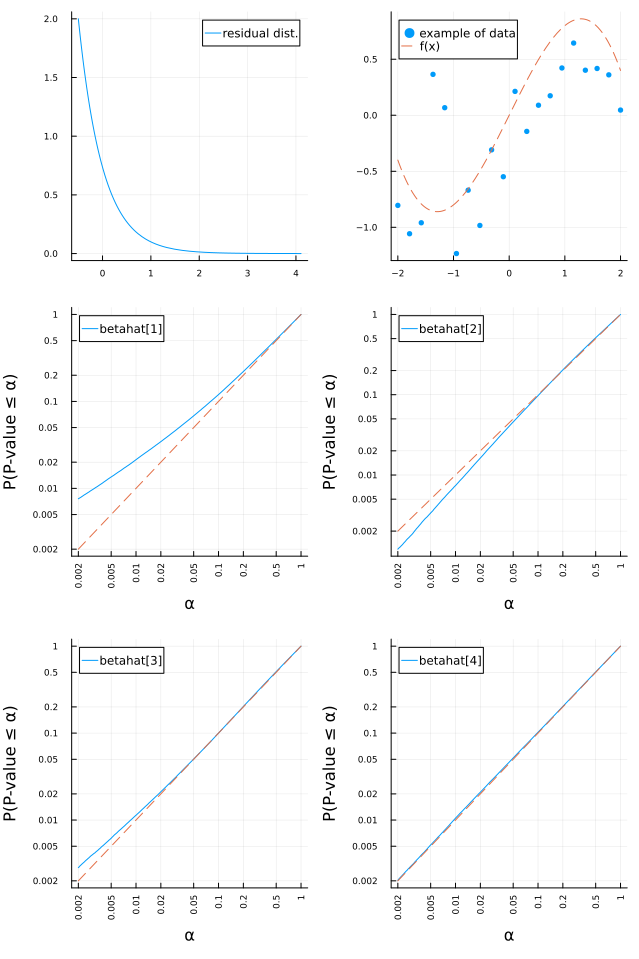

In [17]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0002198, 0.9999, -8.438e-5, -0.1999]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1681, 0.2323, 0.08514, 0.08067]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1682, 0.2325, 0.08514, 0.0807]

n = 20
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.068042
ECDF(pval[i, :], α) = 0.959556
ECDF(pval[i, :], α) = 0.049554
ECDF(pval[i, :], α) = 0.684521


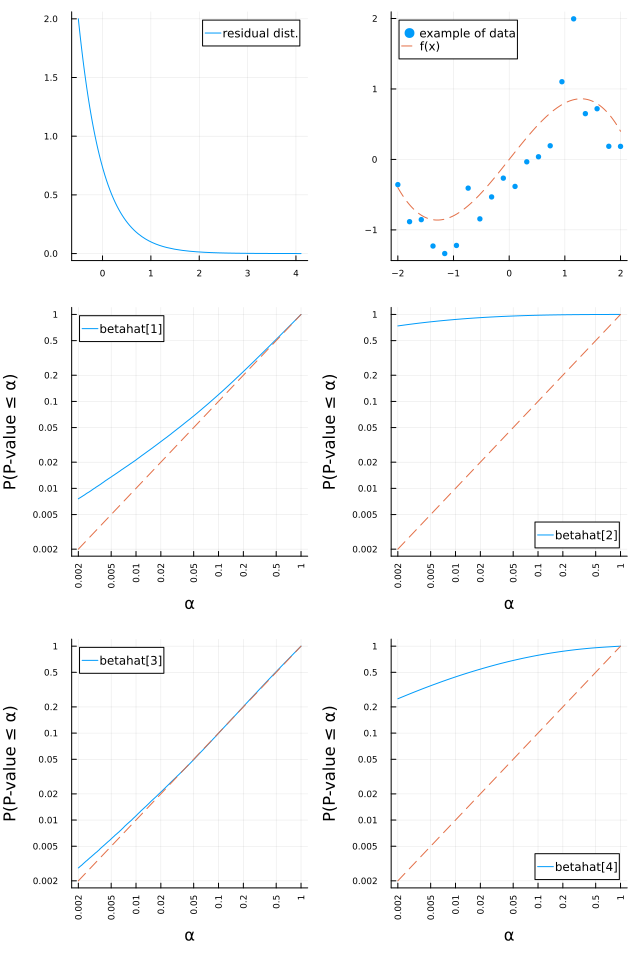

In [18]:
x = range(-2, 2, 20)
β = [0, 1, 0, -0.2]
dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001397, 1.0, -2.761e-5, -0.2001]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1185, 0.1672, 0.06301, 0.06081]

n = 40
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.059439
ECDF(pval[i, :], α) = 0.047823
ECDF(pval[i, :], α) = 0.04827
ECDF(pval[i, :], α) = 0.049843


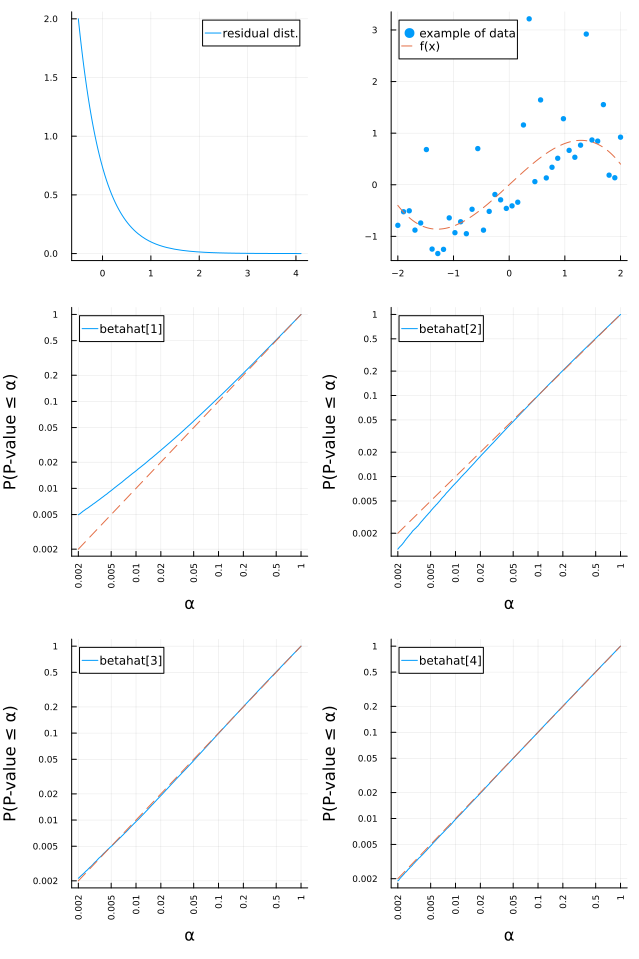

In [19]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [0.0001672, 1.0, -4.56e-5, -0.2001]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1187, 0.1674, 0.0631, 0.06086]

n = 40
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.059465
ECDF(pval[i, :], α) = 0.998796
ECDF(pval[i, :], α) = 0.048616
ECDF(pval[i, :], α) = 0.884693


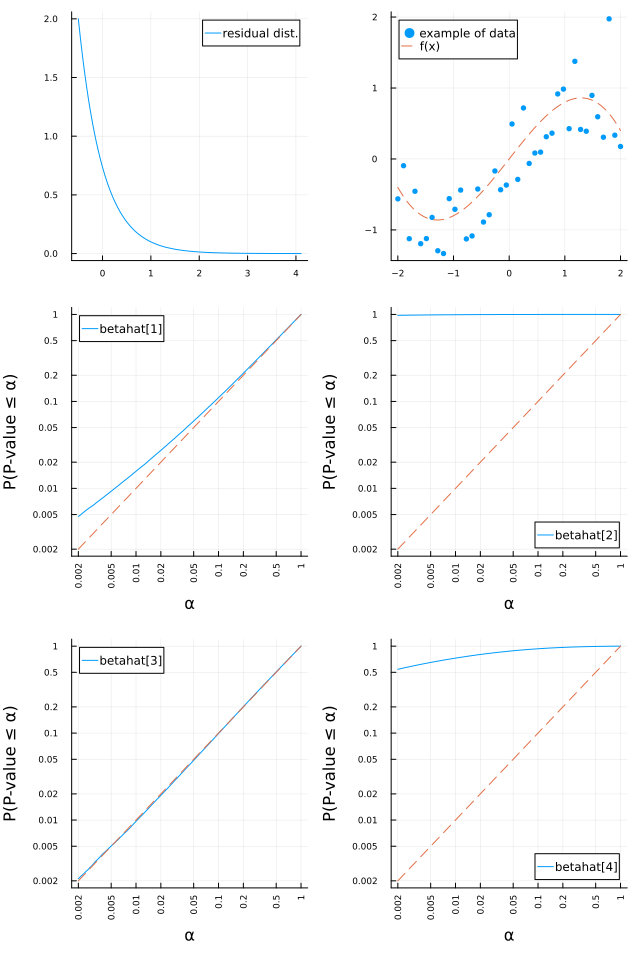

In [20]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-9.859e-5, 1.0, 2.13e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08375, 0.1196, 0.04569, 0.04453]

n = 80
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.054905
ECDF(pval[i, :], α) = 0.04886
ECDF(pval[i, :], α) = 0.048921
ECDF(pval[i, :], α) = 0.049499


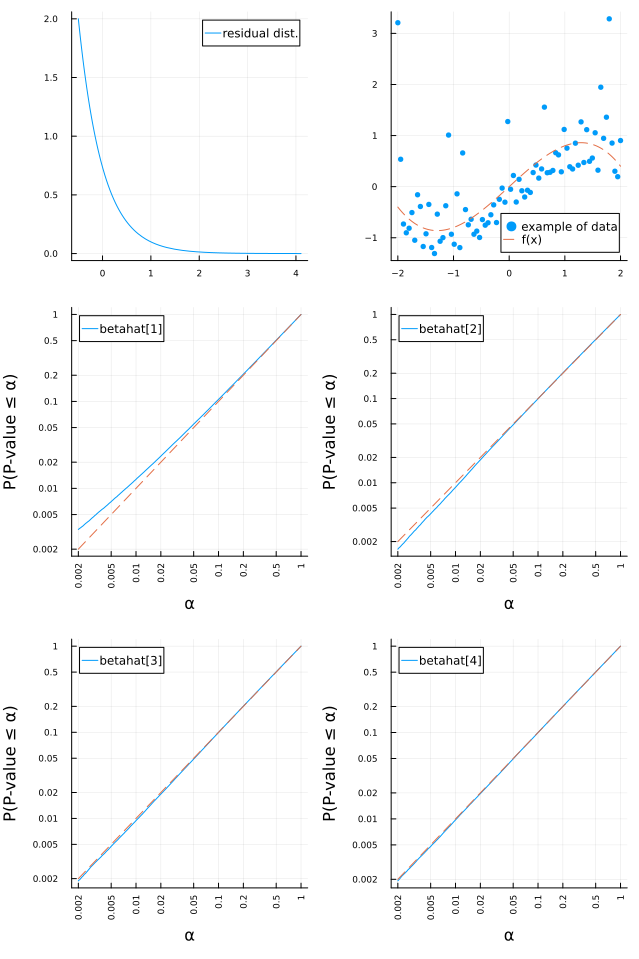

In [21]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, Exponential{Float64}}(
μ: -0.5
σ: 1.0
ρ: Exponential{Float64}(θ=0.5)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [2.123e-5, 0.9999, 2.337e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08392, 0.1195, 0.04571, 0.04453]

n = 80
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 0.0, 0.0, 0.0]
α = 0.05
ECDF(pval[i, :], α) = 0.054872
ECDF(pval[i, :], α) = 0.999999
ECDF(pval[i, :], α) = 0.049042
ECDF(pval[i, :], α) = 0.987912


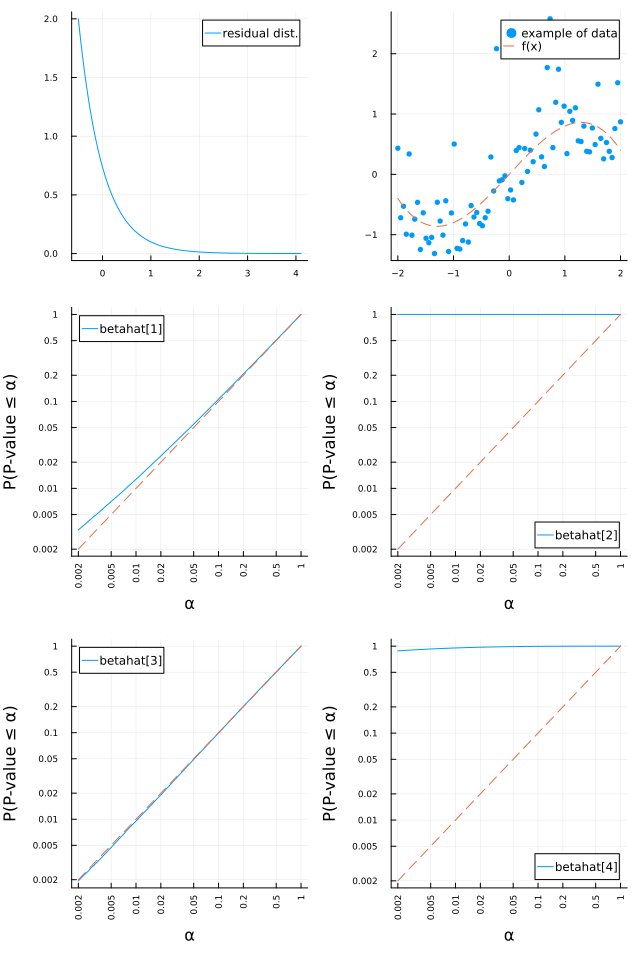

In [22]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = dist = expeczero(Exponential(0.5))
d = 3

plot_sim_pval(x, β, dist, d; L=10^6, β₀=zero(β))

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [5.47e-6, 1.0, -0.0001283, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.1186, 0.1673, 0.06312, 0.06085]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.1186, 0.1672, 0.06305, 0.0608]

n = 40
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.080266
ECDF(pval[i, :], α) = 0.042422
ECDF(pval[i, :], α) = 0.047065
ECDF(pval[i, :], α) = 0.049277


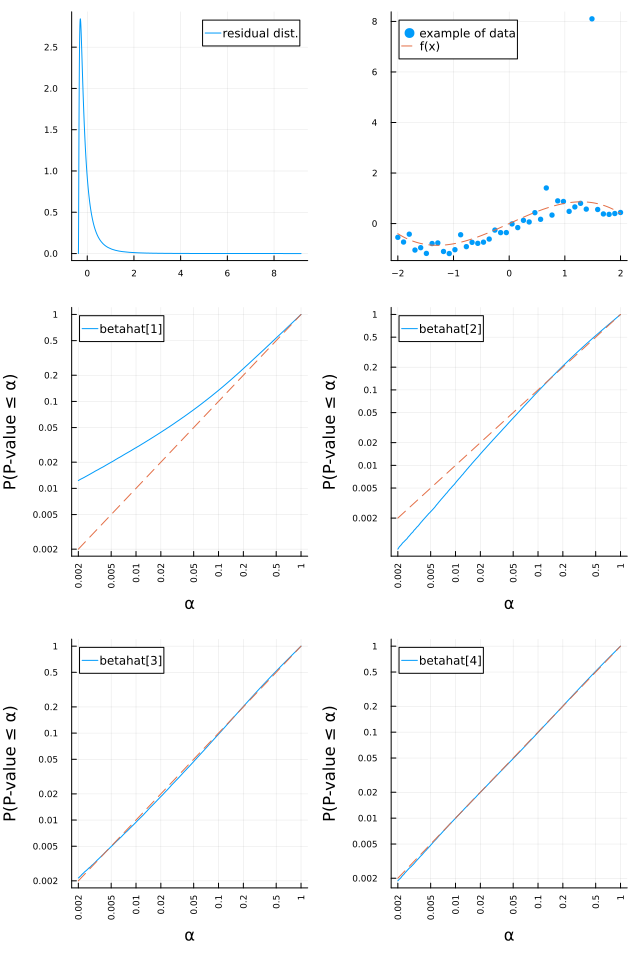

In [23]:
x = range(-2, 2, 40)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-3.54e-5, 1.0, -2.816e-6, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.08386, 0.1196, 0.04573, 0.04456]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.08391, 0.1197, 0.04573, 0.04453]

n = 80
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.068438
ECDF(pval[i, :], α) = 0.044706
ECDF(pval[i, :], α) = 0.047292
ECDF(pval[i, :], α) = 0.048412


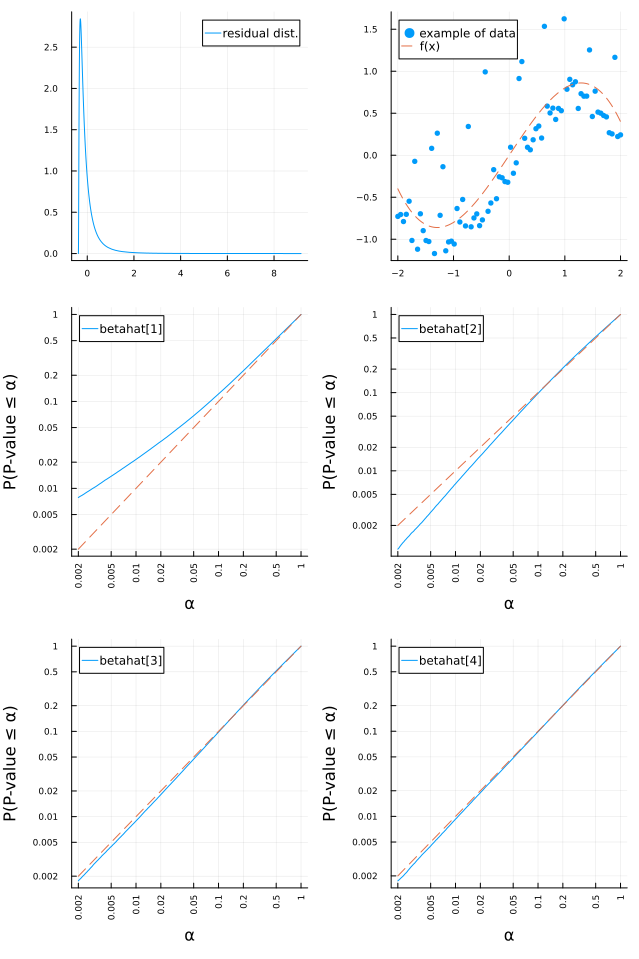

In [24]:
x = range(-2, 2, 80)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-0.0001184, 1.0, 0.0001116, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.05929, 0.08506, 0.03274, 0.03208]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.05927, 0.08501, 0.03275, 0.03206]

n = 160
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.061149
ECDF(pval[i, :], α) = 0.04647
ECDF(pval[i, :], α) = 0.04813
ECDF(pval[i, :], α) = 0.048671


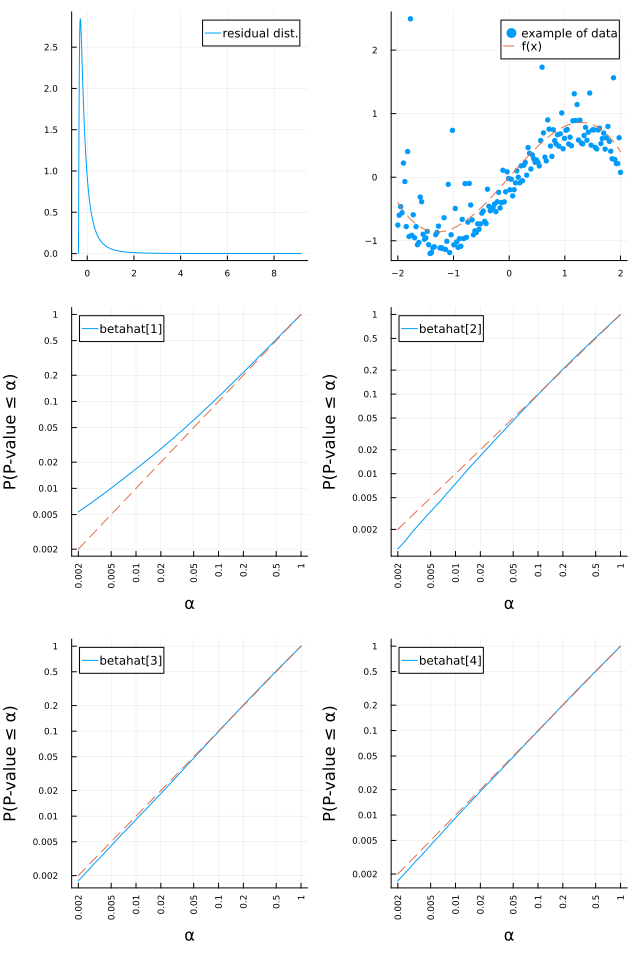

In [25]:
x = range(-2, 2, 160)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)

dist = LocationScale{Float64, Continuous, LogNormal{Float64}}(
μ: -0.3814369891834451
σ: 0.23135322868823557
ρ: LogNormal{Float64}(μ=0.0, σ=1.0)
)

mean(dist) = 0.0
std(dist) = 0.5

β = [0.0, 1.0, 0.0, -0.2]
meanβ̂ = rd.(vec(mean(β̂; dims = 2))) = [-4.089e-5, 1.0, 2.625e-5, -0.2]
rd.(std(dist) * .√(diag(inv(A' * A)))) = [0.04193, 0.06033, 0.02329, 0.0229]
stdβ̂ = rd.(vec(std(β̂; dims = 2))) = [0.04193, 0.06026, 0.0233, 0.02287]

n = 320
d = 3
β = [0.0, 1.0, 0.0, -0.2]
β₀ = [0.0, 1.0, 0.0, -0.2]
α = 0.05
ECDF(pval[i, :], α) = 0.05649
ECDF(pval[i, :], α) = 0.04767
ECDF(pval[i, :], α) = 0.048408
ECDF(pval[i, :], α) = 0.048855


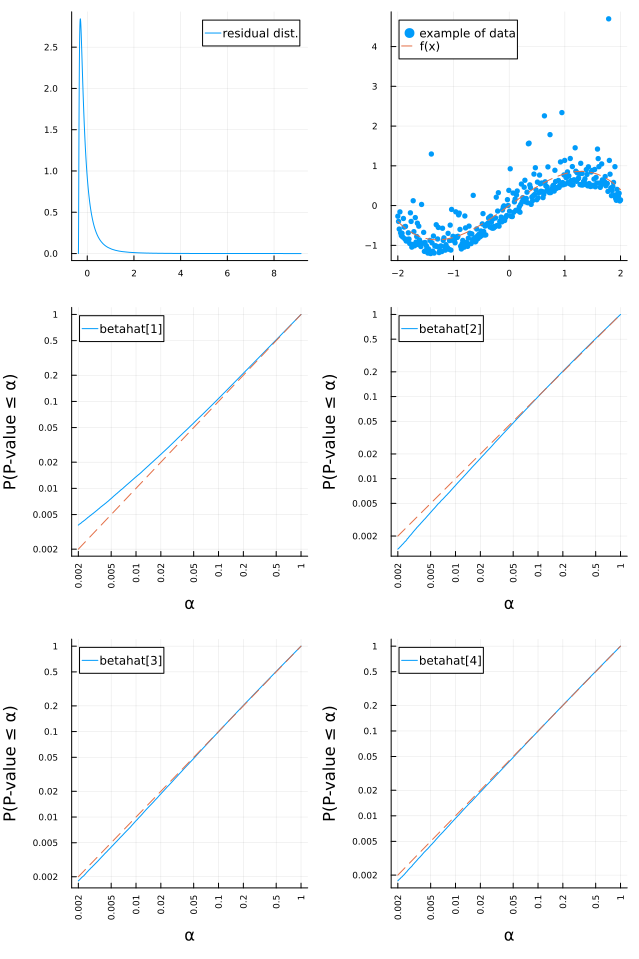

In [26]:
x = range(-2, 2, 320)
β = [0, 1, 0, -0.2]
dist = dist = 0.5standardized(LogNormal())
d = 3

plot_sim_pval(x, β, dist, d; L=10^6)